<h1><center> Learning To See in the Dark, Application to Astronomy </center></h1>

***Aim*** : In terms of observation time, astronomy is expensive. In such low light conditions, our data suffers from low photon counts and low signal-to-noise, in particular if our observation times are short. By using longer exposure times we can improve the noise levels, but at the cost of blurring. Often in astronomy we tend to stack multiple images to simultaneously reduce the noise and increase the signal. But more recently, Chen et al 2018 have developed a convolutional network that is able to enhance low light images to qualities better than any traditional signal processing technique, removing both noise and color biases. Such a technique if successfully applied to astronomy could have big implications for astronomers, including significantly reducing observation times and cost. In this project we will train the convolutional network on our astronomical data and compare it to more traditional methods such as stacking, and testing the scientific viability of machine learning.


***Requirements*** :
- Python (version 2.7 or above) 
- Tensorflow (>=1.1) 
- Scipy 
- Numpy 
- Rawpy

`pip install rawpy`

*** Definition *** :

- Luminance is the luminous intensity, projected on a given area and direction. Luminance is an objectively measurable attribute. The unit is 'Candela per Square Meter' (cd/m2). So, different monitors can be adjusted to the same luminous intensity by measuring the luminance in cd/m2.

- Brightness is a subjective attribute of light. The monitor can be adjusted to a level of light between very dim and very bright. Brightness is perceived and cannot be measured objectively (but scaled, e.g. in %).

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import scipy
import glob
from IPython.display import HTML
import os, time, scipy.io

import rawpy
import cv2
from PIL import Image
from scipy import misc

import tensorflow as tf
import tensorflow.contrib.slim as slim

/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
/anaconda3/lib/python3.6/site-packages/requests/__init__.py:80: RequestsDependencyWarning: urllib3 (1.21.1) or chardet (2.3.0) doesn't match a supported version!
  RequestsDependencyWarning)


# I. The paper

Reference Paper and code : https://github.com/cchen156/Learning-to-See-in-the-Dark

<img src="Images/fig1.png">

### *** Context *** :

Imaging in low light is challenging due to low photon count and low SNR. Short-exposure images suffer from noise, while long exposure can induce blur and is often impractical. A variety of denoising, deblurring, and enhancement techniques have been proposed, but their effectiveness is limited in extreme conditions, such as video-rate imaging at night.

A photo taken at too high of an ISO will show a lot of grain, also known as noise, and might not be usable. So, brightening a photo via ISO is always a trade-off.


<img src="imageS/iso_dark.jpg">

Postprocessing, such as scaling or histogram stretching, can be applied, but this does not resolve the low signal-to-noise ratio (SNR) due to low photon counts. 

Physical means to increase SNR :
- Opening the aperture
- Extending exposure time
- Use flash

But all have major drawbacks. In the new approach proposed by Chen et al., we train deep neural networks to learn the image processing pipeline for lowlight raw data, including color transformations, demosaicing, noise reduction, and image enhancement, trained end to end to avoid noise amplification.

### *** Method *** : 
Chen et al. propose an end-to-end learning for direct single-image processing of fast low-light images using fully-convolutional networks (FCN) to perform the entier image processing pipeline.

<img src="Images/schema.png">

- #### *Step 1 : Bayer Matrix *
Pack the input into four channels and correspondingly reduce spatial resolution by a factor of two in each dimension. A Bayer filter mosaic is a color filter array (CFA) for arranging RGB color filters on a square grid of photosensors. Its particular arrangement of color filters is used in most single-chip digital image sensors used in digital cameras, camcorders, and scanners to create a color image. The filter pattern is 50% green (since the human eye is most sensitive to green), 25% red and 25% blue, hence is also called BGGR, RGBG, GRGB, or RGGB.

In [2]:
HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/LWxu4rkZBLw?rel=0&amp;controls=0&amp;showinfo=0" frameborder="0" allowfullscreen></iframe>')

- *Optional for Fujifilm* :
X-Trans arrays (not shown in the figure), the raw data is arranged in 6×6 blocks; we pack it into 9 channels instead of 36 channels by exchanging adjacent elements.

- #### *Step 3 : *
Substract the black levels and scale the data by the desired amplification ratio.

- #### *Step 4 : *
Feed the data into a fully-convolutional network, either Multi-scale context aggregation network (CAN) or U-Net have been tested

- #### *Step 5 :*
The output is a 12-channel image with half the spatial resolution.


### ***Datasets*** :
- Sony (25GB, 65GB unzipped) : https://drive.google.com/file/d/1G6VruemZtpOyHjOC5N8Ww3ftVXOydSXx/view -> ARW (Sony Alpha Raw) 
- Fujy (52GB) : https://drive.google.com/file/d/1C7GeZ3Y23k1B8reRL79SqnZbRBc4uizH/view

The dataset has been collected for training and benchmarking single-image processing of raw low-light images. The See-in-the-Dark (SID) dataset contains 5094 raw short-exposure images (input), each with a corresponding long-exposure reference image (output).

# II. Classical Methods

## a. Pipeline

The traditional image processing pipeline applies a sequence of modules such as white balance, demosaicing, denoising, sharpening, color space conversion, gamma correction, and others. Then, use a large collection of local, linear, and learned (L3) filters to approximate the complex nonlinear pipelines found in modern consumer imaging systems. Another Burst pipeline is proposed for Smartphone images. 

<img src="images/pipeline.png">

## b. Test picture

In [7]:
test_pic = "/Users/maelfabien/Desktop/LocalDB/Sony/dataset/short/00001_00_0.1s.ARW"

In [8]:
raw = rawpy.imread(test_pic)
img_array = raw.postprocess() #no_auto_bright=True
img = misc.toimage(img_array, high=255, low=0, cmin=0, cmax=255)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
  This is separate from the ipykernel package so we can avoid doing imports until


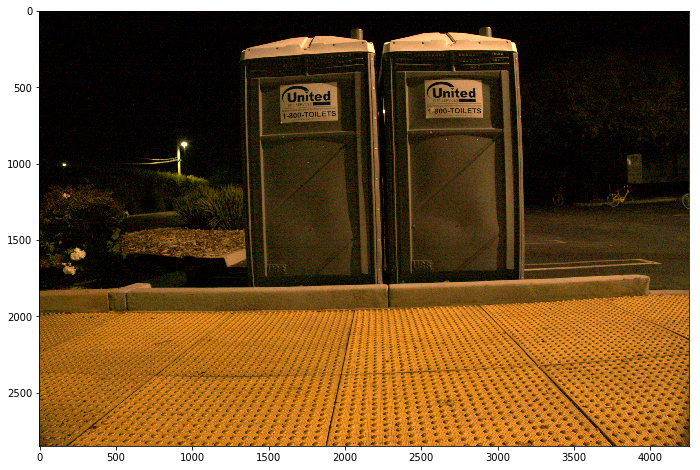

In [9]:
plt.figure(figsize=(12,8))
plt.imshow(img)
plt.show()

Check image dimensions :

In [10]:
lng = '/Users/maelfabien/Desktop/LocalDB/Sony/dataset/long/20208_00_10s.ARW'
raw_2 = rawpy.imread(lng)
img_array_2 = raw.postprocess() #no_auto_bright=True
img_2 = misc.toimage(img_array_2, high=255, low=0, cmin=0, cmax=255)
np.array(img_2).shape

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
  after removing the cwd from sys.path.


(2848, 4256, 3)

In [11]:
lng = '/Users/maelfabien/Desktop/LocalDB/Sony/dataset/short/20208_08_0.04s.ARW'
raw_3 = rawpy.imread(lng)
img_array_3 = raw.postprocess() #no_auto_bright=True
img_3 = misc.toimage(img_array_3, high=255, low=0, cmin=0, cmax=255)
np.array(img_3).shape

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
  after removing the cwd from sys.path.


(2848, 4256, 3)

## c. Traditional Pipeline

White Balance improves the luminosity : https://stackoverflow.com/questions/46390779/automatic-white-balancing-with-grayworld-assumption

In [2]:
def white_balance(img_arr):
    result=cv2.cvtColor(img_arr,cv2.COLOR_BGR2LAB)
    avg_a=np.average(result[:,:,1])
    avg_b=np.average(result[:,:,2])
    result[:,:,1]=result[:,:,1]-((avg_a-128)*(result[:,:,0]/255.0)*1.1)
    result[:,:,2]=result[:,:,2]-((avg_b-128)*(result[:,:,0]/255.0)*1.1)
    result=cv2.cvtColor(result,cv2.COLOR_LAB2BGR)
    return result

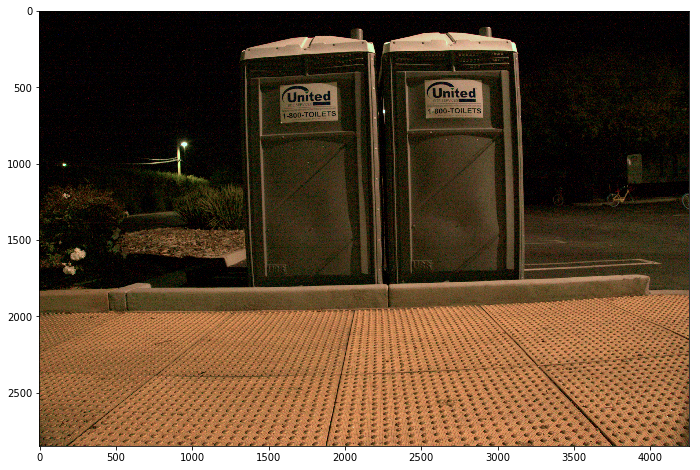

In [13]:
white = white_balance(img_array)
plt.figure(figsize=(12,8))
plt.imshow(white)
plt.show()

Then, apply demosaicing and interpolate between unknow values of Bayer matrix.

In [3]:
def demosaicing(img_arr,imrows,imcols):
    nans = np.isnan(img_arr)
    x = lambda z: z.nonzero()[0]
    img_arr[nans]= np.interp(x(nans), x(~nans), img_arr[~nans])
    return img_arr

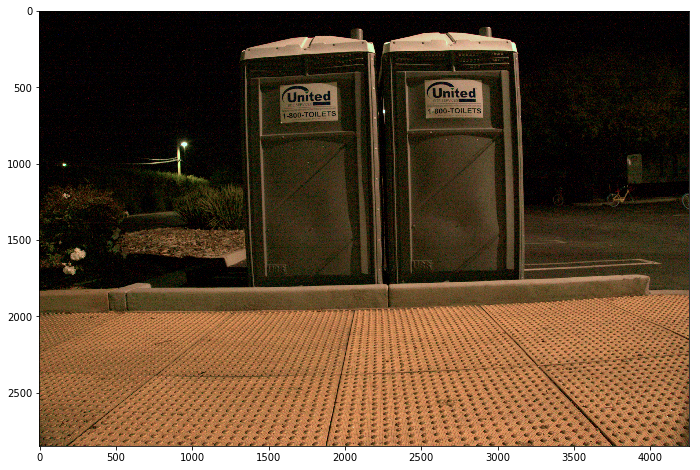

In [15]:
width,height,channels=white.shape
demo = demosaicing(white,width, height)
plt.figure(figsize=(12,8))
plt.imshow(demo)
plt.show()

Then, perform image denoising using Non-local Means Denoising algorithm :

In [4]:
def denoising_sharpening(img_arr):
    dst= cv2.fastNlMeansDenoisingColored(img_arr, None,10,10,7,21)
    kernel=np.array([[-1,-1,-1,-1,-1],
                     [-1,2,2,2,-1],
                     [-1,2,8,2,-1],
                     [-2,2,2,2,-1],
                     [-1,-1,-1,-1,-1]])/8.0
    dst = cv2.filter2D(dst,-1,kernel)
    return dst

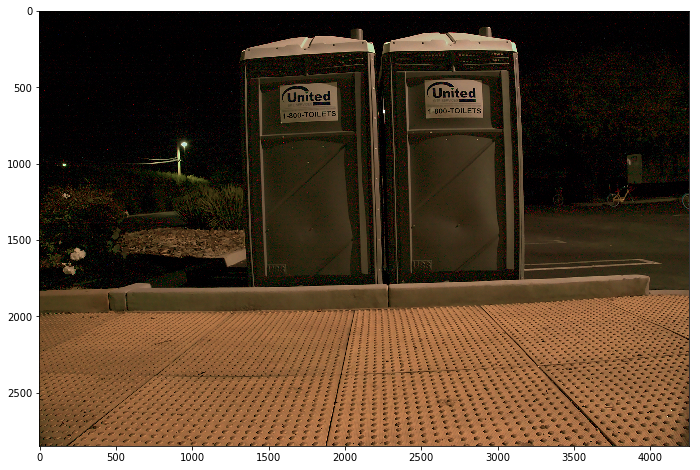

In [11]:
deno = denoising_sharpening(demo)
plt.figure(figsize=(12,8))
plt.imshow(deno)
plt.show()

Gamma correction, or often simply gamma, is a nonlinear operation used to encode and decode luminance or tristimulus values in video or still image systems.

In [5]:
def gamma_correction(img_arr, gamma=1.0):
    invGamma=1.0/ gamma
    table=np.array([((i/255.0)**invGamma)*255
                   for i in np.arange(0,256)]).astype("uint8")
    return cv2.LUT(img_arr,table)

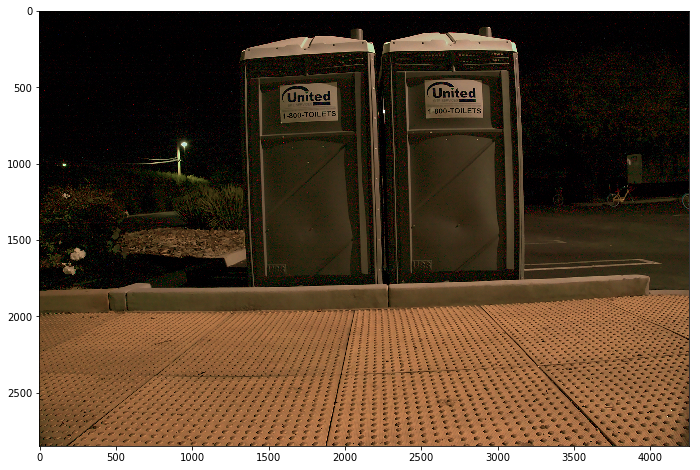

In [13]:
gamma = gamma_correction(deno)
plt.figure(figsize=(12,8))
plt.imshow(gamma)
plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
  """Entry point for launching an IPython kernel.


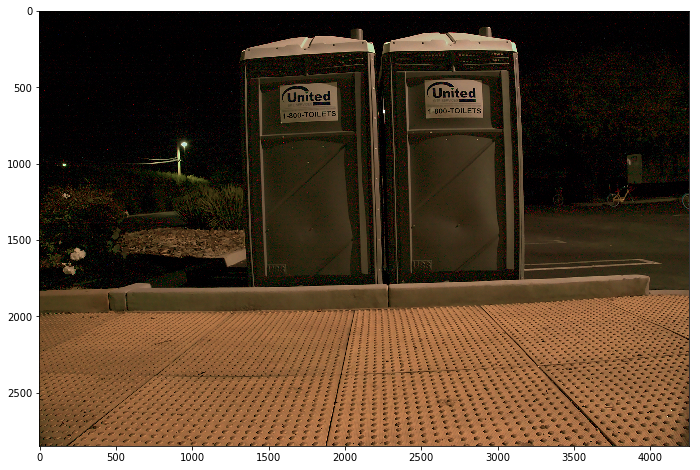

In [14]:
image = misc.toimage(gamma, high=255, low=0, cmin=0, cmax=255)
plt.figure(figsize=(12,8))
plt.imshow(image)
plt.show()

Then, build the whole pipeline :

In [6]:
def traditional_approach(filename):
    
    raw=rawpy.imread(filename)
    img_array=raw.postprocess()
    
    fig=plt.figure(figsize=(18,18))
    #fig = plt.subplots(3, 2, sharex=True, sharey=True)
    #plt.title("Traditional Pipeline for image enhancement")
    
    fig.add_subplot(321)
    plt.title("Image")
    plt.imshow(img_array)
    
    whiteb_result=white_balance(img_array)
    width,height,channels=whiteb_result.shape
    fig.add_subplot(322)
    plt.title("WhiteBalance")
    plt.imshow(whiteb_result)

    demosaic_result = demosaicing(whiteb_result,width,height)
    fig.add_subplot(323)
    plt.title("Demosaicing")
    plt.imshow(demosaic_result)
    
    denoise_sharpen_result=denoising_sharpening(demosaic_result)
    fig.add_subplot(324)
    plt.title("Denoising")
    plt.imshow(denoise_sharpen_result)
    
    gamma_correct=gamma_correction(denoise_sharpen_result)
    fig.add_subplot(325)
    plt.title("Gamma Correct")
    plt.imshow(gamma_correct)
    
    img = misc.toimage(gamma_correct, high=255, low=0, cmin=0, cmax=255)
    img.save('./Output/'+filename.split('/')[3][:5]+'v1_trad.png')
    
    fig.add_subplot(326)
    plt.title("Output")
    plt.imshow(img)
    
    plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


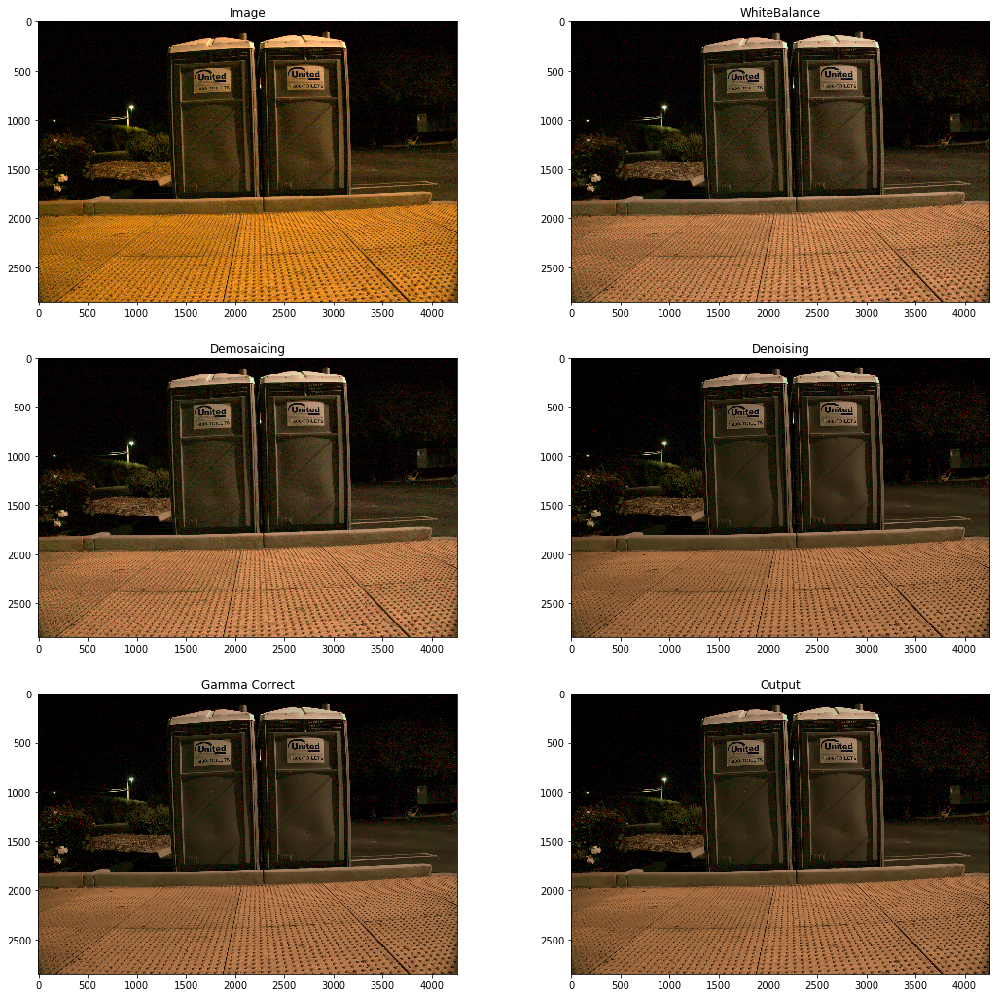

In [16]:
traditional_approach(test_pic)

# III. Deep Learning Architecture

### Path to data

In [7]:
local_path = '/Users/maelfabien/Desktop/LocalDB/Sony'
input_dir = local_path + '/dataset/short/'
gt_dir = local_path + '/dataset/long/'
checkpoint_dir = local_path + '/result_Sony/'
result_dir = local_path + '/result_Sony/'

### Train set parameters

In [8]:
# get train IDs
train_fns = glob.glob(gt_dir + '0*.ARW')
train_ids = [int(os.path.basename(train_fn)[0:5]) for train_fn in train_fns]

ps = 512  # patch size for training
save_freq = 500

DEBUG = 0
if DEBUG == 1:
    save_freq = 2
    train_ids = train_ids[0:5]

### Model Architecture

The architecture implemented here is a U-Net :

<img src="images/unet.png">

In [7]:
# Leaky Relu
def lrelu(x):
    return tf.maximum(x * 0.2, x)

In [8]:
# The need for transposed convolutions allows to go in opposite direction to normal convolution
def upsample_and_concat(x1, x2, output_channels, in_channels):
    pool_size = 2
    deconv_filter = tf.Variable(tf.truncated_normal([pool_size, pool_size, output_channels, in_channels], stddev=0.02))
    deconv = tf.nn.conv2d_transpose(x1, deconv_filter, tf.shape(x2), strides=[1, pool_size, pool_size, 1])

    deconv_output = tf.concat([deconv, x2], 3)
    deconv_output.set_shape([None, None, None, output_channels * 2]) # * 2

    return deconv_output

In [9]:
# Network architecture
def network(inp):
    # Conv, Conv, Pool
    conv1 = slim.conv2d(inp, 32, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv1_1')
    conv1 = slim.conv2d(conv1, 32, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv1_2')
    pool1 = slim.max_pool2d(conv1, [2, 2], padding='SAME')

    # Conv, Conv, Pool
    conv2 = slim.conv2d(pool1, 64, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv2_1')
    conv2 = slim.conv2d(conv2, 64, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv2_2')
    pool2 = slim.max_pool2d(conv2, [2, 2], padding='SAME')

    # Conv, Conv, Pool
    conv3 = slim.conv2d(pool2, 128, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv3_1')
    conv3 = slim.conv2d(conv3, 128, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv3_2')
    pool3 = slim.max_pool2d(conv3, [2, 2], padding='SAME')

    # Conv, Conv, Pool
    conv4 = slim.conv2d(pool3, 256, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv4_1')
    conv4 = slim.conv2d(conv4, 256, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv4_2')
    pool4 = slim.max_pool2d(conv4, [2, 2], padding='SAME')

    # Conv, Conv
    conv5 = slim.conv2d(pool4, 512, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv5_1')
    conv5 = slim.conv2d(conv5, 512, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv5_2')
    
    # Upsampling of the feature map (“up-convolution”) that halves the number of feature channels
    # Up, conv, conv
    up6 = upsample_and_concat(conv5, conv4, 256, 512)
    conv6 = slim.conv2d(up6, 256, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv6_1')
    conv6 = slim.conv2d(conv6, 256, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv6_2')
    
    # Up, conv, conv
    up7 = upsample_and_concat(conv6, conv3, 128, 256)
    conv7 = slim.conv2d(up7, 128, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv7_1')
    conv7 = slim.conv2d(conv7, 128, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv7_2')

    # Up, conv, conv
    up8 = upsample_and_concat(conv7, conv2, 64, 128)
    conv8 = slim.conv2d(up8, 64, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv8_1')
    conv8 = slim.conv2d(conv8, 64, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv8_2')

    # Up, conv, conv
    up9 = upsample_and_concat(conv8, conv1, 32, 64)
    conv9 = slim.conv2d(up9, 32, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv9_1')
    conv9 = slim.conv2d(conv9, 32, [3, 3], rate=1, activation_fn=lrelu, scope='g_conv9_2')

    # Conv, Output
    conv10 = slim.conv2d(conv9, 12, [1, 1], rate=1, activation_fn=None, scope='g_conv10')
    out = tf.depth_to_space(conv10, 2)
    return out

In [10]:
# Bayers arrays for RAW images
def pack_raw(raw):
    # pack Bayer image to 4 channels
    im = raw.raw_image_visible.astype(np.float32)
    im = np.maximum(im - 512, 0) / (16383 - 512)  # subtract the black level

    im = np.expand_dims(im, axis=2)
    img_shape = im.shape
    H = img_shape[0]
    W = img_shape[1]

    out = np.concatenate((im[0:H:2, 0:W:2, :],
                          im[0:H:2, 1:W:2, :],
                          im[1:H:2, 1:W:2, :],
                          im[1:H:2, 0:W:2, :]), axis=2)
    return out

### Tensorflow Parameters

In [23]:
sess = tf.Session()

# Input Image
in_image = tf.placeholder(tf.float32, [None, None, None, 4])
# Target Image
gt_image = tf.placeholder(tf.float32, [None, None, None, 3])
# Output Image
out_image = network(in_image)

# Reduce distance between both
G_loss = tf.reduce_mean(tf.abs(out_image - gt_image))

# Adam Optimizer
t_vars = tf.trainable_variables()
lr = tf.placeholder(tf.float32)
G_opt = tf.train.AdamOptimizer(learning_rate=lr).minimize(G_loss)

# Save Session
saver = tf.train.Saver()
sess.run(tf.global_variables_initializer())

ckpt = tf.train.get_checkpoint_state(checkpoint_dir)

In [25]:
if ckpt:
    print('loaded ' + ckpt.model_checkpoint_path)
    saver.restore(sess, ckpt.model_checkpoint_path)

### Load raw data

In [26]:
# Raw data takes long time to load. Keep them in memory after loaded.

# Initialize target images
gt_images = [None] * 6000
input_images = {}
# For the different ratios
input_images['300'] = [None] * len(train_ids)
input_images['250'] = [None] * len(train_ids)
input_images['100'] = [None] * len(train_ids)

# Initialize loss
g_loss = np.zeros((5000, 1))

allfolders = glob.glob('./result/*0')
lastepoch = 0

for folder in allfolders:
    lastepoch = np.maximum(lastepoch, int(folder[-4:]))


# IV. Train the model of RAW files

In [27]:
learning_rate = 1e-4

for epoch in range(lastepoch, 6) : #4001):
    
    if os.path.isdir("result/%04d" % epoch):
        continue
    cnt = 0
    
    # Decrease learning rate over time
    # Exponential decay ?
    if epoch > 2000:
        learning_rate = 1e-5

    # Random permutation among training set
    for ind in np.random.permutation(len(train_ids)):
        # get the path from image id
        train_id = train_ids[ind]
        
        # Input file (selected some)
        in_files = glob.glob(input_dir + '%05d_00*.ARW' % train_id)
        in_path = in_files[np.random.random_integers(0, len(in_files) - 1)]
        in_fn = os.path.basename(in_path)

        # Target file
        gt_files = glob.glob(gt_dir + '%05d_00*.ARW' % train_id)
        gt_path = gt_files[0]
        gt_fn = os.path.basename(gt_path)
        
        # Exposure of input 
        in_exposure = float(in_fn[9:-5])
        gt_exposure = float(gt_fn[9:-5])
        
        # Ratio should not go above this threshold
        ratio = min(gt_exposure / in_exposure, 300)

        st = time.time()
        cnt += 1
        
        # Rescale image if needed
        if input_images[str(ratio)[0:3]][ind] is None:
            raw = rawpy.imread(in_path)
            input_images[str(ratio)[0:3]][ind] = np.expand_dims(pack_raw(raw), axis=0) * ratio

            gt_raw = rawpy.imread(gt_path)
            im = gt_raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=16)
            gt_images[ind] = np.expand_dims(np.float32(im / 65535.0), axis=0)

        # crop
        H = input_images[str(ratio)[0:3]][ind].shape[1]
        W = input_images[str(ratio)[0:3]][ind].shape[2]

        xx = np.random.randint(0, W - ps)
        yy = np.random.randint(0, H - ps)
        input_patch = input_images[str(ratio)[0:3]][ind][:, yy:yy + ps, xx:xx + ps, :]
        gt_patch = gt_images[ind][:, yy * 2:yy * 2 + ps * 2, xx * 2:xx * 2 + ps * 2, :]

        if np.random.randint(2, size=1)[0] == 1:  # random flip
            input_patch = np.flip(input_patch, axis=1)
            gt_patch = np.flip(gt_patch, axis=1)
        if np.random.randint(2, size=1)[0] == 1:
            input_patch = np.flip(input_patch, axis=2)
            gt_patch = np.flip(gt_patch, axis=2)
        if np.random.randint(2, size=1)[0] == 1:  # random transpose
            input_patch = np.transpose(input_patch, (0, 2, 1, 3))
            gt_patch = np.transpose(gt_patch, (0, 2, 1, 3))

        input_patch = np.minimum(input_patch, 1.0)

        _, G_current, output = sess.run([G_opt, G_loss, out_image],
                                        feed_dict={in_image: input_patch, gt_image: gt_patch, lr: learning_rate})
        output = np.minimum(np.maximum(output, 0), 1)
        g_loss[ind] = G_current

        print("%d %d Loss=%.3f Time=%.3f" % (epoch, cnt, np.mean(g_loss[np.where(g_loss)]), time.time() - st))

        if epoch % save_freq == 0:
            if not os.path.isdir(result_dir + '%04d' % epoch):
                os.makedirs(result_dir + '%04d' % epoch)

            temp = np.concatenate((gt_patch[0, :, :, :], output[0, :, :, :]), axis=1)
            scipy.misc.toimage(temp * 255, high=255, low=0, cmin=0, cmax=255).save(
                result_dir + '%04d/%05d_00_train_%d.jpg' % (epoch, train_id, ratio))

    saver.save(sess, checkpoint_dir + 'model.ckpt')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:21: DeprecationWarning: This function is deprecated. Please call randint(0, 1 + 1) instead


0 1 Loss=0.188 Time=10.246


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:81: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:21: DeprecationWarning: This function is deprecated. Please call randint(0, 0 + 1) instead


0 2 Loss=0.287 Time=11.584


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:21: DeprecationWarning: This function is deprecated. Please call randint(0, 2 + 1) instead


0 3 Loss=0.232 Time=11.233
0 4 Loss=0.263 Time=11.472
0 5 Loss=0.227 Time=11.417
0 6 Loss=0.262 Time=11.155
0 7 Loss=0.239 Time=11.081
0 8 Loss=0.243 Time=11.382
0 9 Loss=0.253 Time=11.453
0 10 Loss=0.245 Time=11.290
0 11 Loss=0.241 Time=12.165
0 12 Loss=0.237 Time=11.673
0 13 Loss=0.237 Time=11.773
0 14 Loss=0.238 Time=11.647
0 15 Loss=0.235 Time=11.545
0 16 Loss=0.238 Time=11.375
0 17 Loss=0.228 Time=11.064
0 18 Loss=0.224 Time=11.796
0 19 Loss=0.217 Time=11.124
0 20 Loss=0.225 Time=12.386
0 21 Loss=0.219 Time=12.014
0 22 Loss=0.217 Time=11.616
0 23 Loss=0.209 Time=11.944
0 24 Loss=0.202 Time=11.183
0 25 Loss=0.206 Time=11.519
0 26 Loss=0.214 Time=11.227
0 27 Loss=0.219 Time=11.647
0 28 Loss=0.220 Time=11.518
0 29 Loss=0.219 Time=11.449
0 30 Loss=0.214 Time=11.464
0 31 Loss=0.211 Time=11.374
0 32 Loss=0.211 Time=12.042
0 33 Loss=0.208 Time=11.990
0 34 Loss=0.206 Time=11.547
0 35 Loss=0.203 Time=11.577
0 36 Loss=0.202 Time=12.262
0 37 Loss=0.203 Time=11.264
0 38 Loss=0.203 Time=10.897

1 136 Loss=0.093 Time=8.356
1 137 Loss=0.093 Time=8.535
1 138 Loss=0.093 Time=8.389
1 139 Loss=0.093 Time=8.161
1 140 Loss=0.093 Time=8.197
1 141 Loss=0.092 Time=8.523
1 142 Loss=0.092 Time=11.590
1 143 Loss=0.091 Time=8.428
1 144 Loss=0.092 Time=11.650
1 145 Loss=0.091 Time=8.310
1 146 Loss=0.090 Time=7.979
1 147 Loss=0.090 Time=8.095
1 148 Loss=0.090 Time=8.091
1 149 Loss=0.089 Time=8.258
1 150 Loss=0.090 Time=8.518
1 151 Loss=0.090 Time=11.705
1 152 Loss=0.089 Time=11.319
1 153 Loss=0.089 Time=8.444
1 154 Loss=0.089 Time=9.603
1 155 Loss=0.088 Time=11.742
1 156 Loss=0.088 Time=11.218
1 157 Loss=0.087 Time=8.430
1 158 Loss=0.087 Time=11.518
1 159 Loss=0.087 Time=8.390
1 160 Loss=0.087 Time=8.058
1 161 Loss=0.087 Time=8.375
2 1 Loss=0.087 Time=8.738
2 2 Loss=0.087 Time=8.427
2 3 Loss=0.087 Time=11.566
2 4 Loss=0.086 Time=8.132
2 5 Loss=0.086 Time=8.488
2 6 Loss=0.087 Time=8.212
2 7 Loss=0.087 Time=8.364
2 8 Loss=0.087 Time=8.347
2 9 Loss=0.087 Time=8.383
2 10 Loss=0.087 Time=8.386
2 1

3 113 Loss=0.072 Time=7.609
3 114 Loss=0.072 Time=7.731
3 115 Loss=0.072 Time=7.571
3 116 Loss=0.072 Time=7.549
3 117 Loss=0.072 Time=7.737
3 118 Loss=0.072 Time=7.875
3 119 Loss=0.072 Time=7.748
3 120 Loss=0.072 Time=7.481
3 121 Loss=0.072 Time=7.462
3 122 Loss=0.072 Time=7.939
3 123 Loss=0.072 Time=7.731
3 124 Loss=0.072 Time=7.769
3 125 Loss=0.072 Time=7.618
3 126 Loss=0.072 Time=7.683
3 127 Loss=0.072 Time=7.676
3 128 Loss=0.072 Time=7.611
3 129 Loss=0.072 Time=7.251
3 130 Loss=0.072 Time=7.442
3 131 Loss=0.072 Time=7.523
3 132 Loss=0.072 Time=7.619
3 133 Loss=0.072 Time=7.706
3 134 Loss=0.072 Time=7.722
3 135 Loss=0.072 Time=10.337
3 136 Loss=0.072 Time=7.522
3 137 Loss=0.072 Time=7.871
3 138 Loss=0.072 Time=7.944
3 139 Loss=0.072 Time=7.590
3 140 Loss=0.072 Time=7.459
3 141 Loss=0.072 Time=7.733
3 142 Loss=0.072 Time=7.356
3 143 Loss=0.072 Time=7.571
3 144 Loss=0.072 Time=7.433
3 145 Loss=0.072 Time=7.593
3 146 Loss=0.071 Time=7.782
3 147 Loss=0.071 Time=7.780
3 148 Loss=0.071 Ti

5 91 Loss=0.064 Time=8.544
5 92 Loss=0.064 Time=8.762
5 93 Loss=0.065 Time=8.385
5 94 Loss=0.065 Time=7.571
5 95 Loss=0.065 Time=7.812
5 96 Loss=0.065 Time=7.776
5 97 Loss=0.065 Time=7.669
5 98 Loss=0.065 Time=7.788
5 99 Loss=0.065 Time=7.546
5 100 Loss=0.065 Time=7.527
5 101 Loss=0.065 Time=7.677
5 102 Loss=0.065 Time=7.667
5 103 Loss=0.065 Time=7.481
5 104 Loss=0.065 Time=7.831
5 105 Loss=0.065 Time=7.741
5 106 Loss=0.065 Time=7.840
5 107 Loss=0.065 Time=7.667
5 108 Loss=0.065 Time=7.575
5 109 Loss=0.065 Time=7.650
5 110 Loss=0.066 Time=7.693
5 111 Loss=0.066 Time=7.413
5 112 Loss=0.066 Time=7.577
5 113 Loss=0.066 Time=7.727
5 114 Loss=0.066 Time=7.566
5 115 Loss=0.066 Time=7.798
5 116 Loss=0.066 Time=7.691
5 117 Loss=0.065 Time=7.807
5 118 Loss=0.065 Time=7.692
5 119 Loss=0.065 Time=7.792
5 120 Loss=0.065 Time=7.707
5 121 Loss=0.065 Time=7.665
5 122 Loss=0.065 Time=7.613
5 123 Loss=0.065 Time=7.763
5 124 Loss=0.065 Time=7.674
5 125 Loss=0.065 Time=7.511
5 126 Loss=0.065 Time=7.828
5

### Predictions on the test set

In [28]:
if not os.path.isdir(result_dir + 'final/'):
    os.makedirs(result_dir + 'final/')

# get test IDs
test_fns = glob.glob(gt_dir + '/1*.ARW')
test_ids = [int(os.path.basename(test_fn)[0:5]) for test_fn in test_fns]

In [29]:
for test_id in test_ids:
    # test the first image in each sequence
    in_files = glob.glob(input_dir + '%05d_00*.ARW' % test_id)
    
    for k in range(len(in_files)):
        # pick the image
        in_path = in_files[k]
        in_fn = os.path.basename(in_path)
        print(in_fn)
        
        gt_files = glob.glob(gt_dir + '%05d_00*.ARW' % test_id)
        gt_path = gt_files[0]
        gt_fn = os.path.basename(gt_path)
        
        # Expose of input and output
        in_exposure = float(in_fn[9:-5])
        gt_exposure = float(gt_fn[9:-5])
        ratio = min(gt_exposure / in_exposure, 300)

        # Read the image
        raw = rawpy.imread(in_path)
        input_full = np.expand_dims(pack_raw(raw), axis=0) * ratio
        
        # Process scale full image
        im = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=16)
        # scale_full = np.expand_dims(np.float32(im/65535.0),axis = 0)*ratio
        scale_full = np.expand_dims(np.float32(im / 65535.0), axis=0)

        # Process target full image
        gt_raw = rawpy.imread(gt_path)
        im = gt_raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=16)
        gt_full = np.expand_dims(np.float32(im / 65535.0), axis=0)
        
        input_full = np.minimum(input_full, 1.0)
        
        # Output image
        output = sess.run(out_image, feed_dict={in_image: input_full})
        output = np.minimum(np.maximum(output, 0), 1)
        
        # Array format
        output = output[0, :, :, :]
        gt_full = gt_full[0, :, :, :]
        scale_full = scale_full[0, :, :, :]
        
        # Scale the low-light image to the same mean of the groundtruth
        scale_full = scale_full * np.mean(gt_full) / np.mean(scale_full)
        
        # Save images
        scipy.misc.toimage(output * 255, high=255, low=0, cmin=0, cmax=255).save(
            result_dir + 'final/%5d_00_%d_out.png' % (test_id, ratio))
        scipy.misc.toimage(scale_full * 255, high=255, low=0, cmin=0, cmax=255).save(
            result_dir + 'final/%5d_00_%d_scale.png' % (test_id, ratio))
        scipy.misc.toimage(gt_full * 255, high=255, low=0, cmin=0, cmax=255).save(
            result_dir + 'final/%5d_00_%d_gt.png' % (test_id, ratio))

10054_00_0.04s.ARW


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:51: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:53: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


10054_00_0.1s.ARW
10199_00_0.033s.ARW
10199_00_0.04s.ARW
10199_00_0.1s.ARW
10140_00_0.1s.ARW
10045_00_0.1s.ARW
10045_00_0.04s.ARW
10185_00_0.033s.ARW
10185_00_0.04s.ARW
10185_00_0.1s.ARW
10213_00_0.1s.ARW
10213_00_0.04s.ARW
10213_00_0.033s.ARW
10022_00_0.04s.ARW
10022_00_0.1s.ARW
10172_00_0.1s.ARW
10040_00_0.1s.ARW
10040_00_0.04s.ARW
10191_00_0.04s.ARW
10191_00_0.033s.ARW
10191_00_0.1s.ARW
10101_00_0.1s.ARW
10163_00_0.1s.ARW
10077_00_0.1s.ARW
10106_00_0.1s.ARW
10003_00_0.04s.ARW
10003_00_0.1s.ARW
10034_00_0.04s.ARW
10034_00_0.1s.ARW
10093_00_0.1s.ARW
10187_00_0.1s.ARW
10187_00_0.033s.ARW
10187_00_0.04s.ARW
10082_00_0.1s.ARW
10226_00_0.033s.ARW
10226_00_0.04s.ARW
10226_00_0.1s.ARW
10178_00_0.033s.ARW
10178_00_0.1s.ARW
10178_00_0.04s.ARW
10139_00_0.1s.ARW
10069_00_0.04s.ARW
10069_00_0.1s.ARW
10087_00_0.1s.ARW
10170_00_0.1s.ARW
10125_00_0.1s.ARW
10103_00_0.1s.ARW
10006_00_0.04s.ARW
10006_00_0.1s.ARW
10193_00_0.1s.ARW
10193_00_0.04s.ARW
10193_00_0.033s.ARW
10126_00_0.1s.ARW
10111_00_0.1s.A

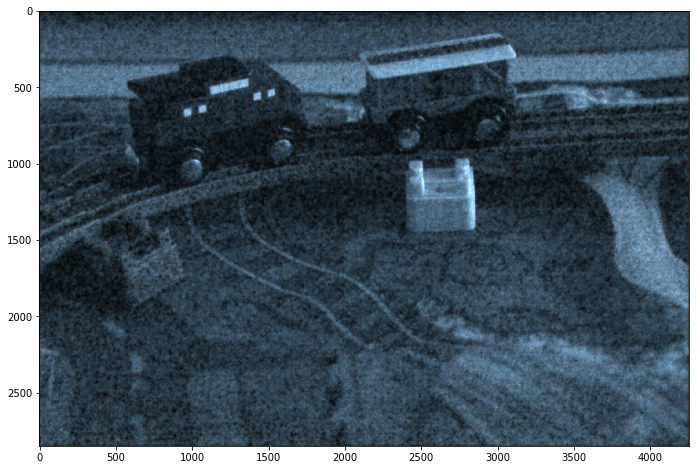

In [30]:
ex_input = "/Users/maelfabien/Desktop/LocalDB/Sony/result_Sony/final/10199_00_300_out.png"
ex_scale = "/Users/maelfabien/Desktop/LocalDB/Sony/result_Sony/final/10199_00_300_scale.png"
ex_out = "/Users/maelfabien/Desktop/LocalDB/Sony/result_Sony/final/10199_00_300_gt.png"

plt.figure(figsize=(12,8))
plt.imshow(cv2.imread(ex_input))
plt.show()

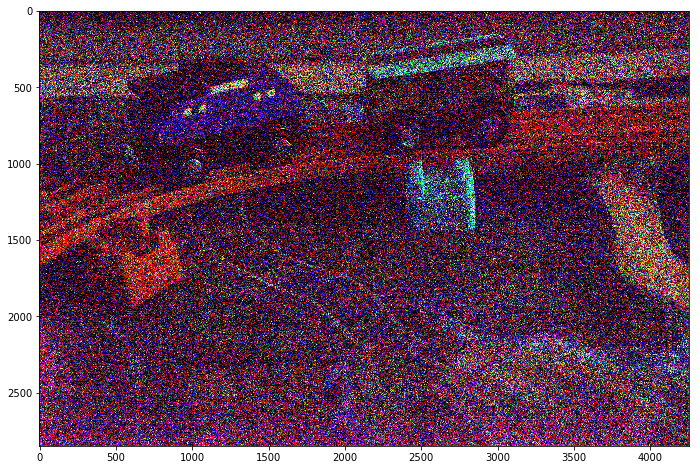

In [31]:
plt.figure(figsize=(12,8))
plt.imshow(cv2.imread(ex_scale))
plt.show()

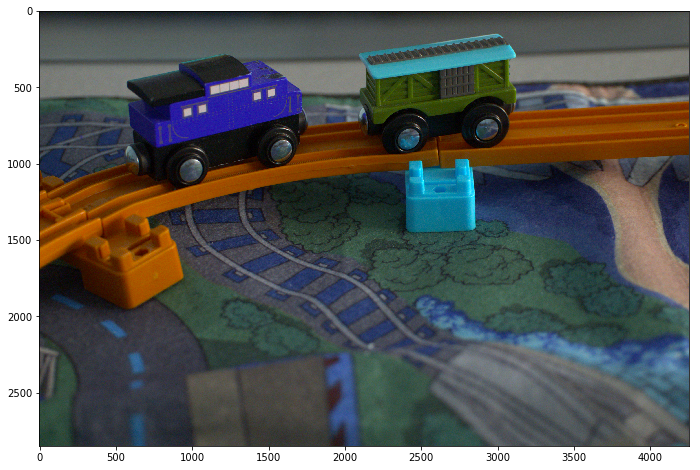

In [32]:
plt.figure(figsize=(12,8))
plt.imshow(cv2.imread(ex_out))
plt.show()

### Predict on a single picture

In [33]:
def traditional_approach(filename):
    
    raw=rawpy.imread(filename)
    img_array=raw.postprocess()
    
    whiteb_result=white_balance(img_array)
    width,height,channels=whiteb_result.shape

    demosaic_result = demosaicing(whiteb_result,width,height)
    
    denoise_sharpen_result=denoising_sharpening(demosaic_result)
    
    gamma_correct=gamma_correction(denoise_sharpen_result)
    
    img = misc.toimage(gamma_correct, high=255, low=0, cmin=0, cmax=255)
    #img.save('./Output/'+filename.split('/')[3][:5]+'v1_trad.png')
    
    return img

In [34]:
def make_prediction(in_path, gt_path) :

    ratio = 250 #min(gt_exposure / in_exposure, 300)

    # Read the image
    raw = rawpy.imread(in_path)
    input_full = np.expand_dims(pack_raw(raw), axis=0) * ratio
        
    # Process scale full image
    im = raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=16)
    # scale_full = np.expand_dims(np.float32(im/65535.0),axis = 0)*ratio
    scale_full = np.expand_dims(np.float32(im / 65535.0), axis=0)

    # Process target full image
    gt_raw = rawpy.imread(gt_path)
    im = gt_raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=16)
    gt_full = np.expand_dims(np.float32(im / 65535.0), axis=0)
        
    input_full = np.minimum(input_full, 1.0)
        
    # Output image
    output = sess.run(out_image, feed_dict={in_image: input_full})
    
    output = np.minimum(np.maximum(output, 0), 1)
        
    # Array format
    output = output[0, :, :, :]
    gt_full = gt_full[0, :, :, :]
    scale_full = scale_full[0, :, :, :]
        
    # Scale the low-light image to the same mean of the groundtruth
    scale_full = scale_full * np.mean(gt_full) / np.mean(scale_full)
        
    # Save images
    scipy.misc.toimage(input_full[0,:, :, :] * 255, high=255, low=0, cmin=0, cmax=255).save(
            result_dir + 'final/input.png')
    scipy.misc.toimage(output * 255, high=255, low=0, cmin=0, cmax=255).save(
            result_dir + 'final/pred.png')
    scipy.misc.toimage(scale_full * 255, high=255, low=0, cmin=0, cmax=255).save(
            result_dir + 'final/scale.png')
    scipy.misc.toimage(gt_full * 255, high=255, low=0, cmin=0, cmax=255).save(
            result_dir + 'final/real_output.png')
    
    ex_in = result_dir + 'final/input.png'
    ex_pred = result_dir + 'final/pred.png'
    ex_scale = result_dir + 'final/scale.png'
    ex_out = result_dir + 'final/test_output_pred.png'
    
    fig = plt.figure(figsize=(18,18))
    
    fig.add_subplot(511)
    plt.title("Input Image")
    plt.imshow(cv2.imread(ex_in))
    
    fig.add_subplot(512)
    plt.title("Pipeline Image")
    plt.imshow(traditional_approach(in_path))
    
    fig.add_subplot(513)
    plt.title("Scaled Image")
    plt.imshow(cv2.imread(ex_scale))
    
    fig.add_subplot(514)
    plt.title("Deep Learning Image")
    plt.imshow(cv2.imread(ex_pred))
    
    fig.add_subplot(515)
    plt.title("High Exposure Image")
    plt.imshow(cv2.imread(ex_out))
            
    plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:37: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:39: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:41: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: Deprecation

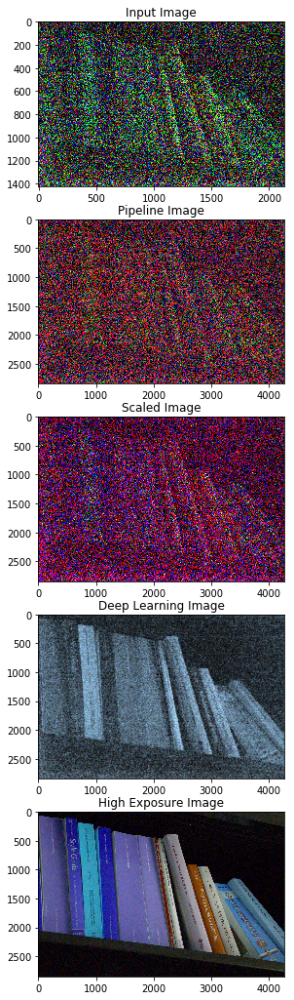

In [35]:
make_prediction("/Users/maelfabien/Desktop/LocalDB/Sony/dataset/short/20210_02_0.04s.ARW", "/Users/maelfabien/Desktop/LocalDB/Sony/dataset/long/20210_00_10s.ARW")

# IV. Train the model of TIFF compressed files

### Traditional Pipeline

In [11]:
def traditional_approach(filename):

    img_array=plt.imread(filename)
    #print(img_array[:,:,:])
    fig=plt.figure(figsize=(18,18))
    
    fig.add_subplot(321)
    plt.title("Image")
    plt.imshow(img_array, 'gray', origin='lower')
    
    whiteb_result=white_balance(img_array)
    width,height,channels=whiteb_result.shape

    fig.add_subplot(322)
    plt.title("WhiteBalance")
    plt.imshow(whiteb_result)

    demosaic_result = demosaicing(whiteb_result,width,height)
    fig.add_subplot(323)
    plt.title("Demosaicing")
    plt.imshow(demosaic_result)
    
    denoise_sharpen_result=denoising_sharpening(demosaic_result)
    fig.add_subplot(324)
    plt.title("Denoising")
    plt.imshow(denoise_sharpen_result)
    
    gamma_correct=gamma_correction(denoise_sharpen_result)
    fig.add_subplot(325)
    plt.title("Gamma Correct")
    plt.imshow(gamma_correct)
    
    img = misc.toimage(gamma_correct, high=255, low=0, cmin=0, cmax=255)
    img.save('./Output/'+filename.split('/')[3][:5]+'v2_trad.png')
    
    fig.add_subplot(326)
    plt.title("Output")
    plt.imshow(img)
    
    plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:33: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


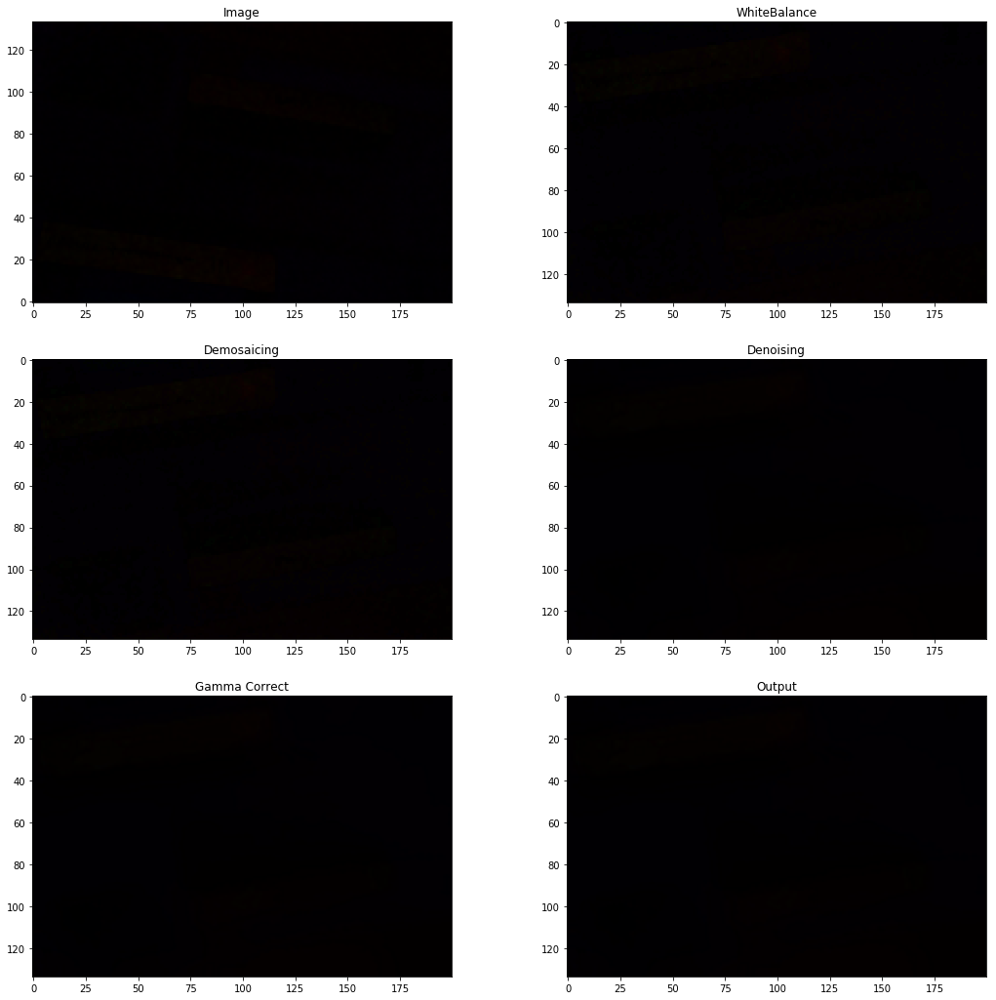

In [12]:
traditional_approach("/Users/maelfabien/Desktop/LocalDB/Sony/dataset_comp/short/short_train/10213_00_0.1s.tiff")

### Path to data

In [13]:
local_path = '/Users/maelfabien/Desktop/LocalDB/Sony/dataset_comp'
input_dir = '/Users/maelfabien/Desktop/LocalDB/Sony/dataset_comp/short/short_train/'
gt_dir = '/Users/maelfabien/Desktop/LocalDB/Sony/dataset_comp/long/long_train/'
checkpoint_dir = local_path + '/result_comp/'
result_dir = local_path + '/result_comp/'

In [14]:
train_fns = glob.glob(input_dir + '*')
train_ids = [os.path.basename(train_fn)[0:5] for train_fn in train_fns]

In [20]:
# Raw data takes long time to load. Keep them in memory after loaded.
save_freq = 500

DEBUG = 0
if DEBUG == 1:
    save_freq = 2
    train_ids = train_ids[0:5]
    
# Initialize target images
gt_images = [None] * 200
input_images = {}
input_images['300'] = [None] * len(train_ids)
input_images['250'] = [None] * len(train_ids)
input_images['100'] = [None] * len(train_ids)

# Initialize loss
g_loss = np.zeros((5000, 1))
ps = 100

#allfolders = glob.glob('./result/*0')
lastepoch = 0

#for folder in allfolders:
    #lastepoch = np.maximum(lastepoch, int(folder[-4:]))


In [16]:
sess = tf.Session()

In [17]:
# Input Image
in_image = tf.placeholder(tf.float32, [None, None, None, 4])
# Target Image
gt_image = tf.placeholder(tf.float32, [None, None, None, 3])
# Output Image
out_image = network(in_image)

# Reduce distance between both
G_loss = tf.reduce_mean(tf.abs(out_image - gt_image))

# Adam Optimizer
t_vars = tf.trainable_variables()
lr = tf.placeholder(tf.float32)
G_opt = tf.train.AdamOptimizer(learning_rate=lr).minimize(G_loss)

# Save Session
saver = tf.train.Saver()
sess.run(tf.global_variables_initializer())

ckpt = tf.train.get_checkpoint_state(checkpoint_dir)

### Train the model

In [22]:
learning_rate = 1e-4

for epoch in range(lastepoch, 6) : #4001):
    
    #if os.path.isdir("result/%04d" % epoch):
        #continue
    cnt = 0
    
    # Decrease learning rate over time
    # Exponential decay ?
    if epoch > 2000:
        learning_rate = 1e-5

    # Random permutation among training set
    for ind in np.arange(len(train_ids)) : #np.random.permutation(len(train_ids)):
        print(ind)
        # get the path from image id
        train_id = train_ids[ind]
        
        # Input file (selected some)
        in_files = glob.glob(str(input_dir + train_id + '*.tiff'))
        in_path = in_files[0]

        in_fn = os.path.basename(in_path)

        # Target file
        gt_files = glob.glob(str(gt_dir + train_id) + '*.tiff')
        gt_path = gt_files[0]
        gt_fn = os.path.basename(gt_path)
        
        # Exposure of input 
        in_exposure = float(in_fn[9:-6])
        gt_exposure = float(gt_fn[9:-6])
        
        # Ratio should not go above this threshold
        ratio = min(gt_exposure / in_exposure, 300)
        print(str(ratio)[:3])
        st = time.time()
        cnt += 1
        
        # Rescale image if needed
        if input_images[str(ratio)[0:3]][ind] is None:
            raw = plt.imread(in_path)
            print(raw)
            input_images[str(ratio)[0:3]][ind] = np.expand_dims(raw, axis=0) * ratio
            #input_raw = cv2.imread(in_path).reshape(1,134,200,3)#[:,:,:3]
        #input_images[str(ratio)[0:3]][ind] = np.expand_dims(input_raw, axis=0) * ratio

        #gt_raw = rawpy.imread(gt_path)
            gt_raw = plt.imread(gt_path) #[:,:,:3].reshape(1,134,200,3)
            gt_images[ind] = np.expand_dims(np.float32(gt_raw / 65535.0), axis=0) #256*256
            #im = gt_raw.postprocess(use_camera_wb=True, half_size=False, no_auto_bright=True, output_bps=16)
        
        input_images[str(ratio)[0:3]]
        # crop
        H = input_images[str(ratio)[0:3]][ind].shape[1]
        W = input_images[str(ratio)[0:3]][ind].shape[2]

        xx = np.random.randint(0, W - ps)
        yy = np.random.randint(0, H - ps)
        
        input_patch = input_images[str(ratio)[0:3]][ind][:, yy:yy + ps, xx:xx + ps, :]
        gt_patch = gt_images[ind][:, 2*yy:2*(yy + ps), 2*xx:2*(xx + ps), :]
        
        #if np.random.randint(2, size=1)[0] == 1:  # random flip
            #input_patch = np.flip(input_patch, axis=1)
            #gt_patch = np.flip(gt_patch, axis=1)
        #if np.random.randint(2, size=1)[0] == 1:
            #input_patch = np.flip(input_patch, axis=2)
            #gt_patch = np.flip(gt_patch, axis=2)
        #if np.random.randint(2, size=1)[0] == 1:  # random transpose
            #input_patch = np.transpose(input_patch, (0, 2, 1, 3))
            #gt_patch = np.transpose(gt_patch, (0, 2, 1, 3))

        input_patch = np.minimum(input_patch, 1.0)
        print(input_patch.shape)
        print(gt_patch.shape)
        
        #print(gt_raw.shape)
        #print(input_raw.shape)
        
        _, G_current, output = sess.run([G_opt, G_loss, out_image],
                                        feed_dict={in_image: input_patch, gt_image: gt_patch, lr: learning_rate})
        
        output = np.minimum(np.maximum(output, 0), 1)
        g_loss[ind] = G_current

        print("%d %d Loss=%.3f Time=%.3f" % (epoch, cnt, np.mean(g_loss[np.where(g_loss)]), time.time() - st))

        #if epoch % save_freq == 0:
            #if not os.path.isdir(result_dir + '%04d' % epoch):
                #os.makedirs(result_dir + '%04d' % epoch)

            #temp = np.concatenate((gt_patch[0, :, :, :], output[0, :, :, :]), axis=1)
            #scipy.misc.toimage(temp * 255, high=255, low=0, cmin=0, cmax=255).save(
                #result_dir + '%d/%d_train_%d.jpg' % (epoch, train_id, ratio))

    saver.save(sess, checkpoint_dir + 'model.ckpt')

0
300
[[[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 [[  1   1   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 ...

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  1   0   0 255]
  [  1   0   0 255]]

 [[  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]
  ...
  [  0   0   0 255]
  [  0   0   0 255]
  [  0   0   0 255]]]
(1, 100, 100, 4)
(1, 128, 4, 4)


ValueError: Cannot feed value of shape (1, 128, 4, 4) for Tensor 'Placeholder_1:0', which has shape '(?, ?, ?, 3)'